# Conventions
* the dictionary datasets will be ordered like this: [amip-piForcing, piControl, abrupt-4xCO2, amip]
  * This means that both ds_regrid and dsfig will be ordered like so

ds_regrid is stored like this
* first order: Degrees (1, 2, and 15)
* second order: experiments (amipf, pictrl, abrupt4co2, amip)

# Necessary Functions

In [1]:
import numpy as np
import xarray as xr
import pandas as pd
from matplotlib import pyplot as plt
import cartopy
import cartopy.crs as ccrs
import scipy as sc
import glob
import os
from scipy.stats import linregress

from sklearn.linear_model import Ridge
#from sklearn.linear_model import RidgeCV
import sklearn
from sklearn.linear_model import LinearRegression 

xr.set_options(display_style='html')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
model_list=['CESM2',
 'MRI-ESM2-0',
 'CNRM-CM6-1',
 'MIROC6',
 'IPSL-CM6A-LR',
 'HadGEM3-GC31-LL',
 'CanESM5',
 'TaiESM1'];

## Loading in data
These 2 cells load in the normal and the regrided datasets. They are both then reassigned the time and weighted for averaging

In [3]:
# This is for the original files
root_path='/data/cristi/a/kchoo3/FluxesProcessing/pre-processed' 

exp = ['amip-piForcing','piControl','abrupt-4xCO2', 'amip']

ds_list = list()

ds_amipf = []
ds_ctrl = []
ds_co2 = []
ds_amip = []


for model_ind in range(len(model_list)):    
    model=model_list[model_ind]
    for experiment in exp:
        # filenames for this particular model and experiment. there shold be three files, for tas, toa,cre. 

        fexp = (f'{experiment}_')
        if experiment != "abrupt-4xCO2":
            aroot_path = (f'{root_path}/annual/')
        else:
            aroot_path = (f'{root_path}/anom/')
        fname_tas=glob.glob(aroot_path+'*_'+model+'_'+fexp+'*.nc')            

        # load data
        ds=xr.open_mfdataset(fname_tas)
        
        # do a little cleaning up. 
        if experiment =='amip-piForcing':
            # let's ensure all models have the same time-interval (1870-2014). This selects the interval that all of them have. 
            ds=ds.sel(time=slice('1870','2014'))

            #compute anomalies relative to the first thirty years (1870-1900).
            ds=ds-ds.sel(time=slice('1870','1900')).mean('time')

            #assign a new time-index
            new_time_index=pd.date_range(start='1870-01-01',freq='YE',periods=145)
            ds=ds.assign(time=new_time_index)
        elif experiment =='amip':
            ds=ds.sel(time=slice('1980','2014'))

            ds=ds-ds.sel(time=slice('1980','2000')).mean('time')

            #assign a new time-index
            new_time_index=pd.date_range(start='1980-01-01',freq='YE',periods=35)
            ds=ds.assign(time=new_time_index)
        elif experiment =='piControl':
            #let's only select 500 years of control simulation       
            ds=ds.isel(time=range(0,500))

            #take anomaly
            ds=ds-ds.mean('time')
            
            #assign a new time-index
            new_time_index=pd.date_range(start='1700-01-01',freq='YE',periods=len(ds.time))
            ds=ds.assign(time=new_time_index)

        elif experiment =='abrupt-4xCO2':    
            ds=ds.isel(time=range(0,150))
            
            #assign a new time-index
            new_time_index=pd.date_range(start='2000-01-01',freq='YE',periods=len(ds.time))
            ds=ds.assign(time=new_time_index)
        
        #create weights for averaging 
        weights = np.cos(np.deg2rad(ds.lat))
        weights.name = "weights"
        
        #compute global averages for TOA, CRE, TAS
        ds=ds.assign(TOA=ds.toa.weighted(weights).mean(("lon", "lat")))
        ds=ds.assign(CRE=ds.cre.weighted(weights).mean(("lon", "lat")))
        ds=ds.assign(TAS=ds.tas.weighted(weights).mean(("lon", "lat")))

        #drop spatial information for toa and cre    
        #ds=ds.drop('toa');
        #ds=ds.drop('cre');
        
        try:
            ds=ds.drop_vars('lat_bnds');
            ds=ds.drop_vars('lon_bnds');
        except:
            print('')

        # assign
        if experiment =='amip-piForcing':
            ds_amipf.append(ds)
        elif experiment =='piControl':
            ds_ctrl.append(ds)
        elif experiment =='abrupt-4xCO2':
            ds_co2.append(ds)
        elif experiment =='amip':
            ds_amip.append(ds)



dsfig = [ds_amipf, ds_ctrl, ds_co2, ds_amip]
print("done")

/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/coding/times.py:995: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/core/indexing.py:630: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()
/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/core/indexing.py:500: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)
/data/keeling/a/kchoo3/anaconda3/envs/myenv/

/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/coding/times.py:995: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/core/indexing.py:630: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()
/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/core/indexing.py:500: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)
/data/keeling/a/kchoo3/anaconda3/envs/myenv/

/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/coding/times.py:995: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/core/indexing.py:630: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()
/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/core/indexing.py:500: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)
/data/keeling/a/kchoo3/anaconda3/envs/myenv/

/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/coding/times.py:995: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/core/indexing.py:630: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()
/data/keeling/a/kchoo3/anaconda3/envs/myenv/lib/python3.12/site-packages/xarray/core/indexing.py:500: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return np.asarray(self.get_duck_array(), dtype=dtype)
/data/keeling/a/kchoo3/anaconda3/envs/myenv/








done


In [4]:
# This is for the new regrided files
root_path='/data/cristi/a/kchoo3/FluxesProcessing/pre-processed/regrid' 

exp = ['amip-piForcing','piControl','abrupt-4xCO2', 'amip']
regrid_number = ['1', '2', '15']

ds_regrid = []
for i in range(len(regrid_number)):
    for model_ind in range(len(model_list)):    
        model=model_list[model_ind]    
        for experiment in exp:
            # filenames for this particular model and experiment. there shold be three files, for tas, toa, cre. 
            fexp = (f'{experiment}_')
            aroot_path = (f'{root_path}/')
            fnames=glob.glob(aroot_path+f'test_*_{regrid_number[i]}deg.nc')
    
            # Rearrange so that it's amip-piforcing, picontrol, abrupt co2, and amip (the same as how dsfig is laid out)
            new_fnames = [fnames[2], fnames[0], fnames[3], fnames[1]]
            
            # load data
            ds_all = []
            for fname in new_fnames:
                ds=xr.open_dataset(fname)
    
                #create weights for averaging 
                weights = np.cos(np.deg2rad(ds.lat))
                weights.name = "weights"
                
                #compute global averages for TOA, CRE, TAS
                ds=ds.assign(TOA=ds.toa.weighted(weights).mean(("lon", "lat")))
                ds=ds.assign(CRE=ds.cre.weighted(weights).mean(("lon", "lat")))
                ds=ds.assign(TAS=ds.tas.weighted(weights).mean(("lon", "lat")))
                
                try:
                    ds=ds.drop_vars('lat_bnds');
                    ds=ds.drop_vars('lon_bnds');
                except:
                    print('')
                
                ds_all.append(ds)
    
            # assign
            da_regrid = ds_all
    ds_regrid.append(da_regrid)
print("done")

































































































done


## Function to plot

In [5]:
def Default_Plot(ds):
    plt.subplot(3,cols,1)
    plt.title(f'Ungrided Global tas\n{exp[n]}')
    plt.plot(ds.time,ds.TAS, label="tas");

    plt.subplot(3,cols,cols+1)
    plt.title(f'Ungrided Global toa\n{exp[n]}')
    plt.plot(ds.time,ds.TOA, label="toa");

    plt.subplot(3,cols,(2*cols)+1)
    plt.title(f'Ungrided Global cre\n{exp[n]}')
    plt.plot(ds.time,ds.CRE, label="cre");

def Regrid_Plot(i, ds, label_name):
    plt.subplot(3,cols,1+i)
    plt.title(f'Regrided Global tas {label_name}\n{exp[n]}')
    plt.plot(ds.time,ds.TAS[mod], label="tas");
    
    plt.subplot(3,cols,cols+1+i)
    plt.title(f'Regrided Global toa {label_name}\n{exp[n]}')
    plt.plot(ds.time,ds.TOA[mod], label="toa");
    
    plt.subplot(3,cols,(2*cols)+1+i)
    plt.title(f'Regrided Global cre {label_name}\n{exp[n]}')
    plt.plot(ds.time,ds.CRE[mod], label="cre");

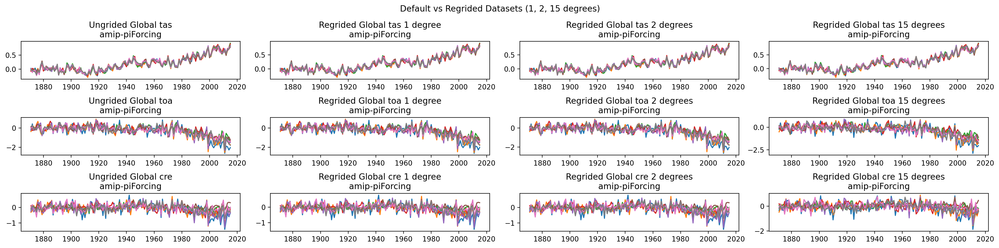

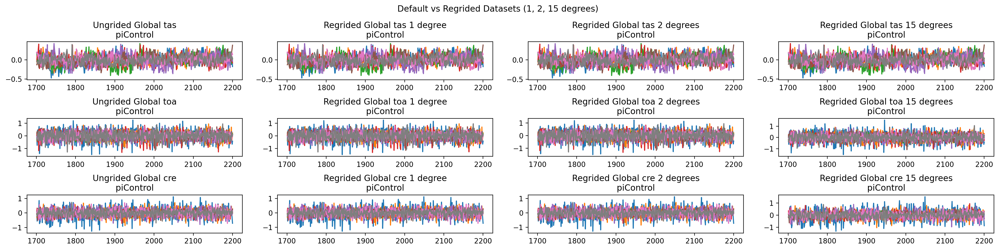

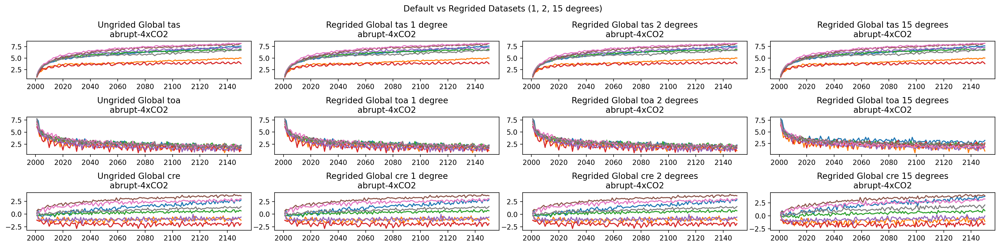

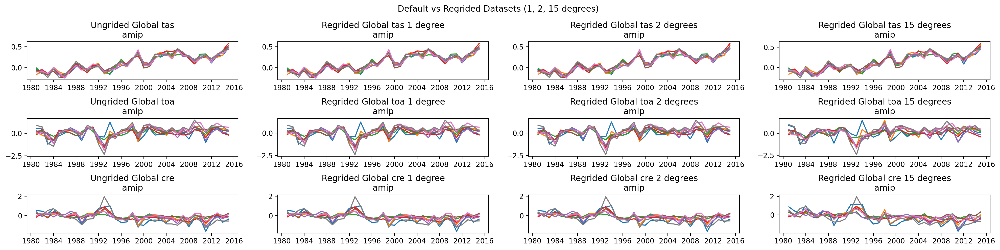

In [6]:
# Graphing Comparison
for n in range(len(dsfig)):
    plt.figure(figsize=[20,5])
    for mod in range(len(model_list)):
        cols = 4
        Default_Plot(ds=dsfig[n][mod])
        Regrid_Plot(1, ds=ds_regrid[0][n], label_name='1 degree')
        Regrid_Plot(2, ds=ds_regrid[1][n], label_name='2 degrees')
        Regrid_Plot(3, ds=ds_regrid[2][n], label_name='15 degrees')
    plt.suptitle('Default vs Regrided Datasets (1, 2, 15 degrees)');
    plt.tight_layout()
    
#plt.close()

## Regression

### Function Definition
This include the following:
- amip-piforcing trained on amip-piforcing
- abrupt4xCO2 trainedon piControl

*** To do: Make a function instead of doing a lot of copy + paste

### Regression Functions (not used yet)

In [ ]:
def Amip_Regression(ds, n):
    #define the X and y (the predictor and the predictand / the input and the output)
    # when you fit the data you need a matrix of predictors X and a vector of targets y. 
    X_fig=ds_regrid_stack.tas
    y_fig=ds_regrid_stack.TOA
    
    # regress and train the model
    if n == 0: #amip-piforcing
        X_train=X_fig.isel(time=ind_train)
        y_train=y_fig.isel(time=ind_train)
    elif n == 1: #control
        X_train=X_fig
        y_train=y_fig
    
    reg_model = sklearn.linear_model.RidgeCV().fit(X_train,y_train)
    
    # make a prediction with the model
    try:
        yhat_fig= reg_model.predict(X_fig)
        
        #save the coefficients.
        beta=reg_model.coef_
        
        #assign
        ds_regrid_stack=ds_regrid_stack.assign(beta=('z',beta))
        ds_regrid_stack=ds_regrid_stack.assign(TOAhat=('time',yhat_fig))

#### For Default Data

In [20]:
## Configuration
# ind_train is used for the timeframe to train. This is only for amip-piforcing. 
# The default (125, 145) is the last 25 years of the model.
ind_train = np.arange(125, 145)

# ==========
# Code below
ds_trained_amipf = [[0 for _ in range(len(model_list))] for _ in range(2)]
for mod in range(len(model_list)):
    for n in range(2):
        #stack the data such that there is a single location dimension (that indexes over both lat and lon)
        ds_fig_stack=dsfig[n][mod].stack(z=('lat','lon'))
        
        #define the X and y (the predictor and the predictand / the input and the output)
        # when you fit the data you need a matrix of predictors X and a vector of targets y. 
        X_fig=ds_fig_stack.tas
        y_fig=ds_fig_stack.TOA
        
        # regress and train the model
        if n == 0: #amip-piforcing
            X_train=X_fig.isel(time=ind_train)
            y_train=y_fig.isel(time=ind_train)
        elif n == 1: #control
            X_train=X_fig
            y_train=y_fig

        reg_model = sklearn.linear_model.RidgeCV().fit(X_train,y_train)
        
        # make a prediction with the model
        try:
            yhat_fig= reg_model.predict(X_fig)
            
            #save the coefficients.
            beta=reg_model.coef_
            
            #assign
            ds_fig_stack=ds_fig_stack.assign(beta=('z',beta))
            ds_fig_stack=ds_fig_stack.assign(TOAhat=('time',yhat_fig))
            
            #unstack
            if n == 0: # calling amip-piforcing datasets
                ds_trained_amipf[0][mod]=ds_fig_stack.unstack()
            elif n == 1: # calling picontrol datasets
                dsfig[n][mod]=ds_fig_stack.unstack() # set it so that picontrol now contains TOAHat and beta
        except ValueError:
            pass
            print("ValueError. Please check the pre-processed data")

#amip-piforcing on picontrol
for mod in range(len(model_list)):
    ds_fig0_stack=dsfig[0][mod].stack(z=('lat','lon'))
    ds_fig1_stack=dsfig[1][mod].stack(z=('lat','lon'))

    X_fig0=ds_fig0_stack.tas
    
    X_fig=ds_fig1_stack.tas
    y_fig=ds_fig1_stack.TOA

    X_train=X_fig
    y_train=y_fig

    reg_model = sklearn.linear_model.RidgeCV().fit(X_train,y_train)

    yhat_fig= reg_model.predict(X_fig0)

    beta=reg_model.coef_

    ds_fig0_stack=ds_fig0_stack.assign(beta=('z',beta))
    ds_fig0_stack=ds_fig0_stack.assign(TOAhat=('time',yhat_fig))

    ds_trained_amipf[1][mod]=ds_fig0_stack.unstack()

#### For Regrided Data

In [29]:
ds_regrid[0][1].isel(model=mod)

<xarray.Dataset> Size: 365MB
Dimensions:  (time: 500, lat: 170, lon: 358)
Coordinates:
  * lat      (lat) int64 1kB -85 -84 -83 -82 -81 -80 -79 ... 79 80 81 82 83 84
  * lon      (lon) int64 3kB 1 2 3 4 5 6 7 8 ... 351 352 353 354 355 356 357 358
  * time     (time) datetime64[ns] 4kB 1700-12-31 1701-12-31 ... 2199-12-31
    model    int64 8B 0
Data variables:
    cre      (time, lat, lon) float32 122MB 0.3116 0.3048 ... 0.9349 0.9238
    tas      (time, lat, lon) float32 122MB -0.5704 -0.5729 ... 0.4625 0.4936
    toa      (time, lat, lon) float32 122MB 0.1741 0.1685 ... -2.248 -2.316
    TOA      (time) float64 4kB -0.01048 -0.7511 0.4546 ... -0.6598 -0.4268
    CRE      (time) float64 4kB 0.03744 -0.568 -0.0831 ... -0.3754 -0.7213
    TAS      (time) float64 4kB -0.04866 0.03536 -0.0496 ... 0.02963 -0.1755

In [30]:
## Configuration
# ind_train is used for the timeframe to train. This is only for amip-piforcing. 
# The default (125, 145) is the last 25 years of the model.
ind_train = np.arange(125, 145)

# ==========
# Code below
ds_regrid_trained_amipf = [[0 for _ in range(len(model_list))] for _ in range(2)]
for mod in range(len(model_list)):
    for n in range(2):
        #stack the data such that there is a single location dimension (that indexes over both lat and lon)
        ds_regrid_stack = ds_regrid[2][n].isel(model=mod).stack(z=('lat','lon'))
        
        #define the X and y (the predictor and the predictand / the input and the output)
        # when you fit the data you need a matrix of predictors X and a vector of targets y. 
        X_fig=ds_regrid_stack.tas
        y_fig=ds_regrid_stack.TOA
        
        # regress and train the model
        if n == 0: #amip-piforcing
            X_train=X_fig.isel(time=ind_train)
            y_train=y_fig.isel(time=ind_train)
        elif n == 1: #control
            X_train=X_fig
            y_train=y_fig

        reg_model = sklearn.linear_model.RidgeCV().fit(X_train,y_train)
        
        # make a prediction with the model
        try:
            yhat_fig= reg_model.predict(X_fig)
            
            #save the coefficients.
            beta=reg_model.coef_
            
            #assign
            ds_regrid_stack=ds_regrid_stack.assign(beta=('z',beta))
            ds_regrid_stack=ds_regrid_stack.assign(TOAhat=('time',yhat_fig))
            
            #unstack
            if n == 0:
                ds_regrid_trained_amipf[0][mod] = ds_regrid_stack.unstack()
            elif n == 1:
                ds_regrid_trained_amipf[1][mod] = ds_regrid_stack.unstack()
        except ValueError:
            pass
            print("ValueError. Please check the pre-processed data")

#amip-piforcing on picontrol
for mod in range(len(model_list)):
    ds_fig0_stack=ds_regrid[2][0].isel(model=mod).stack(z=('lat','lon'))
    ds_fig1_stack=ds_regrid[2][1].isel(model=mod).stack(z=('lat','lon'))

    X_fig0=ds_fig0_stack.tas
    
    X_fig=ds_fig1_stack.tas
    y_fig=ds_fig1_stack.TOA

    X_train=X_fig
    y_train=y_fig

    reg_model = sklearn.linear_model.RidgeCV().fit(X_train,y_train)

    yhat_fig= reg_model.predict(X_fig0)

    beta=reg_model.coef_

    ds_fig0_stack=ds_fig0_stack.assign(beta=('z',beta))
    ds_fig0_stack=ds_fig0_stack.assign(TOAhat=('time',yhat_fig))

    ds_regrid_trained_amipf[1][mod]=ds_fig0_stack.unstack()

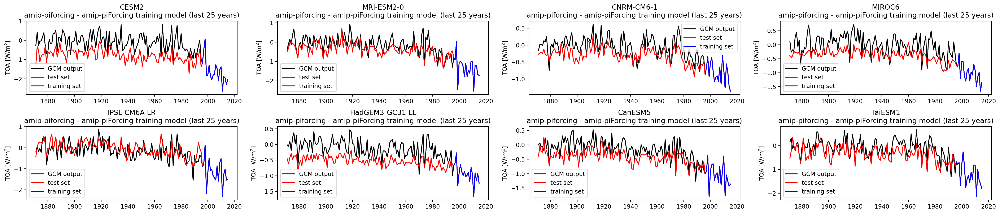

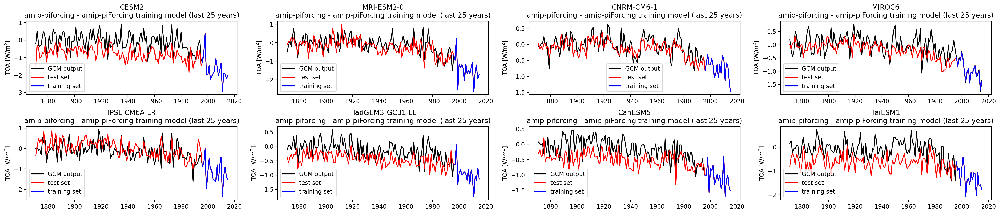

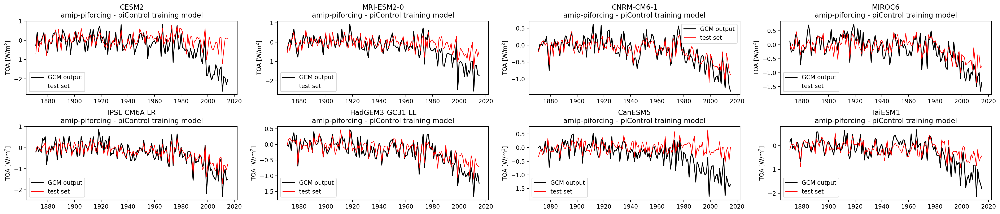

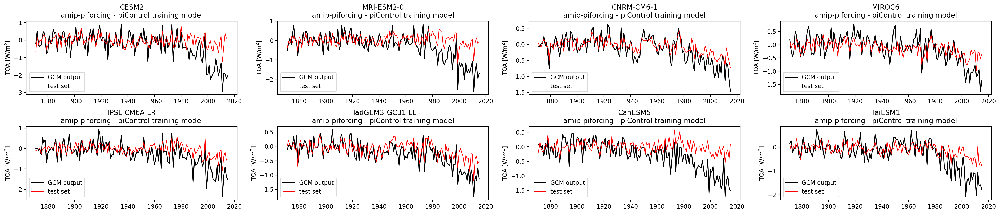

In [31]:
# Showing Graphs
ds_show = [ds_trained_amipf, ds_regrid_trained_amipf]

for n in range(2):
    for ds in ds_show:
        plt.figure(figsize=[24,10])
        for mod in range(len(model_list)):
            plt.subplot(4,4,mod+1)
            plt.plot(ds[n][mod].time,ds[n][mod].TOA,'k',label='GCM output')
            if n == 1: #picontrol trainset
                plt.plot(ds[n][mod].time,ds[n][mod].TOAhat,'r',label='test set', linewidth=1)
                plt.title(f'{model_list[mod]}\namip-piforcing - piControl training model')
            elif n == 0: #amip-piforcing trainset
                plt.plot(ds[n][mod].time,ds[n][mod].TOAhat,'r',label='test set')
                plt.plot(ds[n][mod].isel(time=ind_train).time,ds[n][mod].isel(time=ind_train).TOAhat,'b',label='training set')
                plt.title(f'{model_list[mod]}\namip-piforcing - amip-piForcing training model (last 25 years)')
            plt.ylabel('TOA [W/m$^2$]')
            plt.legend()
        plt.tight_layout()

## Ignore below

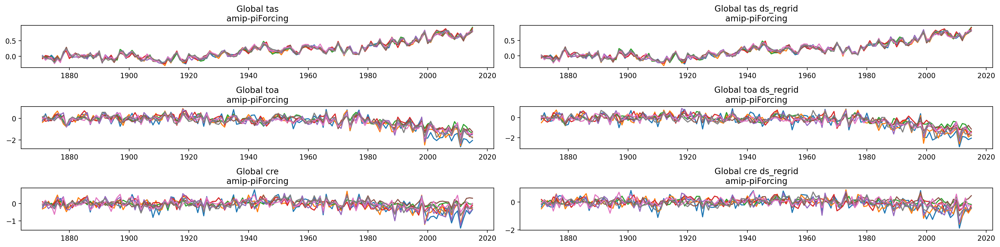

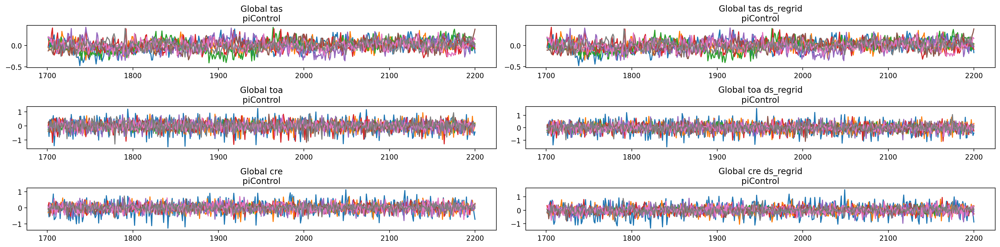

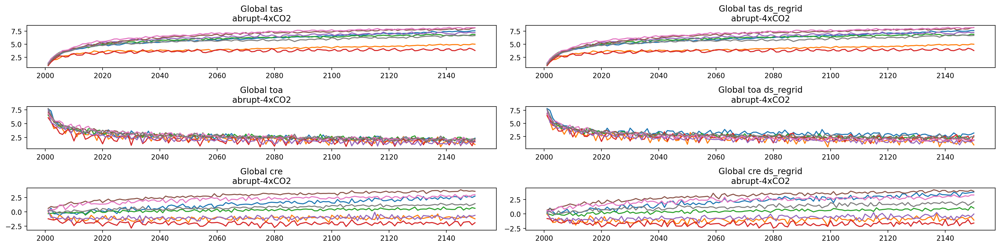

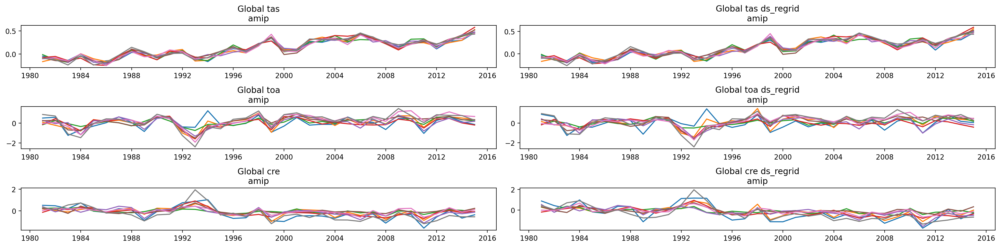

In [18]:
# Graphing Comparison
for n in range(len(dsfig)):
    plt.figure(figsize=[20,5])
    for mod in range(len(model_list)):
        plt.subplot(3,2,1)
        plt.title(f'Global tas\n{exp[n]}')
        plt.plot(dsfig[n][mod].time,dsfig[n][mod].TAS, label="tas");

        plt.subplot(3,2,3)
        plt.title(f'Global toa\n{exp[n]}')
        plt.plot(dsfig[n][mod].time,dsfig[n][mod].TOA, label="toa");

        plt.subplot(3,2,5)
        plt.title(f'Global cre\n{exp[n]}')
        plt.plot(dsfig[n][mod].time,dsfig[n][mod].CRE, label="cre");


        plt.subplot(3,2,2)
        plt.title(f'Global tas ds_regrid\n{exp[n]}')
        plt.plot(ds_regrid[n].time,ds_regrid[n].TAS[mod], label="tas");
        
        plt.subplot(3,2,4)
        plt.title(f'Global toa ds_regrid\n{exp[n]}')
        plt.plot(ds_regrid[n].time,ds_regrid[n].TOA[mod], label="toa");
        
        plt.subplot(3,2,6)
        plt.title(f'Global cre ds_regrid\n{exp[n]}')
        plt.plot(ds_regrid[n].time,ds_regrid[n].CRE[mod], label="cre");
        
        plt.tight_layout()
        
    #plt.close()